# TP 12 : Manipulation d'images

<center><img src=https://raw.githubusercontent.com/cpge-itc/bcpst2/main/files/12_image/intro.png width=80%></center>

## Rappels sur numpy

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,8) # modifie la taille des figures

On peut créer une matrice de taille $n\times p$ remplie de $0$ avec `np.zeros((n,p))` :

In [2]:
m = np.zeros((2, 4))
m

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.]])

On peut accéder et modifier l'élément sur la ligne $i$, colonne $j$ avec `m[i][j]` :

In [3]:
m[0][0] = 1 # modifie l'élément ligne 0, colonne 0 (en haut à gauche)
m

array([[1., 0., 0., 0.],
       [0., 0., 0., 0.]])

**Exercice** : Écrire une fonction `identite` telle que `identite(n)` renvoie une matrice identité de taille $n\times n$.

In [5]:
identite(5)

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

Si `m` est une matrice, `len(m)` est son nombre de lignes et `len(m[0])` est son nombre de colonnes :

In [6]:
print(len(m)) # nombre de lignes
print(len(m[0])) # nombre de colonnes

2
4


On peut aussi utiliser `m.shape` pour obtenir les dimensions de la matrice (sous forme de tuple) :

In [7]:
m.shape # m est de dimension 2x4

(2, 4)

On peut parcourir une matrice avec deux boucles `for` (une boucle pour chaque indice) :

In [8]:
for i in range(len(m)): # parcourt les lignes
    for j in range(len(m[0])): # parcourt les colonnes
        m[i][j] = i + j # modifie la matrice
m

array([[0., 1., 2., 3.],
       [1., 2., 3., 4.]])

**Exercice** : Écrire une fonction `trace` pour calculer la trace d'une matrice, c'est-à-dire la somme des éléments sur la diagonale.

In [10]:
trace(identite(5))

5.0

Il est possible d'effectuer une opération (`+`, `*`...) directement sur deux matrices (ou une matrice et un scalaire) :

In [11]:
m1 = np.array([[7, 2, 5], [1, 5, 6]]) # définition d'une matrice
m2 = np.array([[7, 0, 1], [6, 11, 12]]) # définition d'une autre matrice

m1 + m2 # addition de deux matrices

array([[14,  2,  6],
       [ 7, 16, 18]])

Dans l'exemple ci-dessus, on a effectué l'opération :
$\begin{pmatrix} 7& 2& 5 \\ 1 & 5 & 6 \end{pmatrix} + \begin{pmatrix} 7 & 0 & 1 \\ 6 & 11 & 12 \end{pmatrix} = \begin{pmatrix} 14 & 2 &6 \\ 7 & 16 & 18 \end{pmatrix}$

## Images

Une image est constituée d'un rectangle de pixels, chaque pixel ayant une couleur uniforme représentée par un nombre entier.  
En Python, on utilise généralement un tableau `numpy` à $3$ dimensions pour stocker une image.  
Voici un exemple :

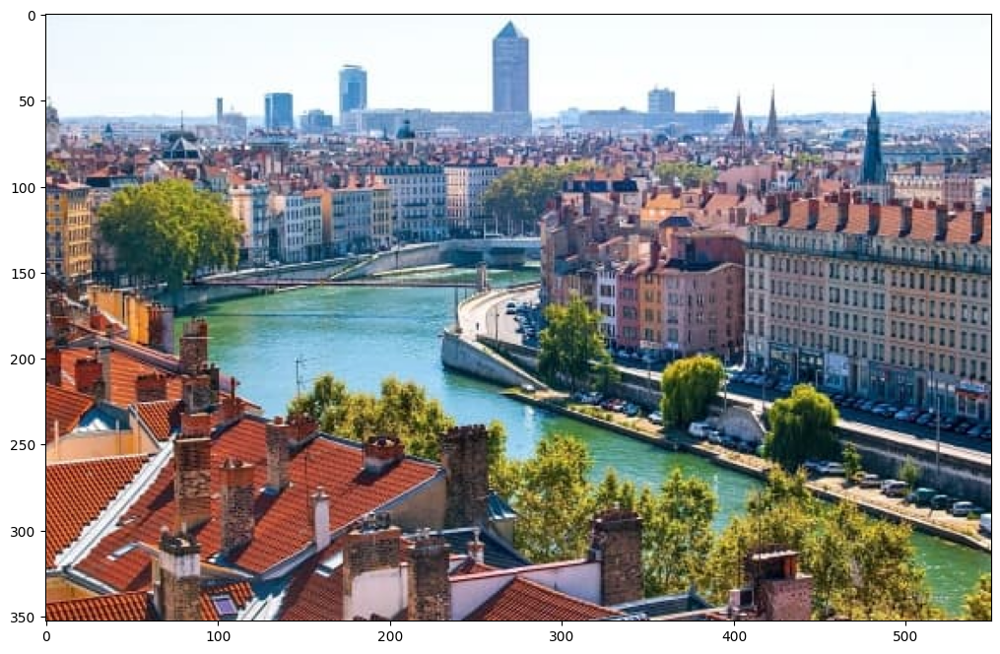

In [12]:
m = plt.imread("lyon1.jpg") # m est un tableau numpy contenant les pixels de l'image
m = m.astype(int)
plt.imshow(m) # afficher une image
plt.show()

In [13]:
m.shape # taille de l'image

(353, 550, 3)

La ligne précédente montre que `m` est de taille $353 \times 550 \times 3$, ce qui signifie que l'image fait $353$ pixels de hauteur, $550$ pixels de largeur et que chaque pixel possède 3 niveaux de couleurs (rouge, vert et bleu, ou RGB), un niveau de couleur étant un nombre entier compris entre 0 (absence de couleur) et 255 (couleur complètement présente).  
Par exemple, un pixel avec des niveaux RGB de $(255, 0, 0)$ est complètement rouge. Un pixel avec des niveaux RGB de $(255, 255, 0)$ est un mélange de rouge et de vert, c'est-à-dire du jaune.  
On accède à un pixel avec `m[i][j]` :

In [14]:
m[12][263] # pixel sur la ligne 12, colonne 263

array([103, 149, 172])

Ainsi, le pixel sur la ligne $12$, colonne $263$, possède des valeurs RGB égales à $(103, 149, 172)$. Le pixel de coordonnées $(0, 0)$ est celui en haut à gauche. Mettons du rouge sur un carré $100\times 100$ en haut à gauche :

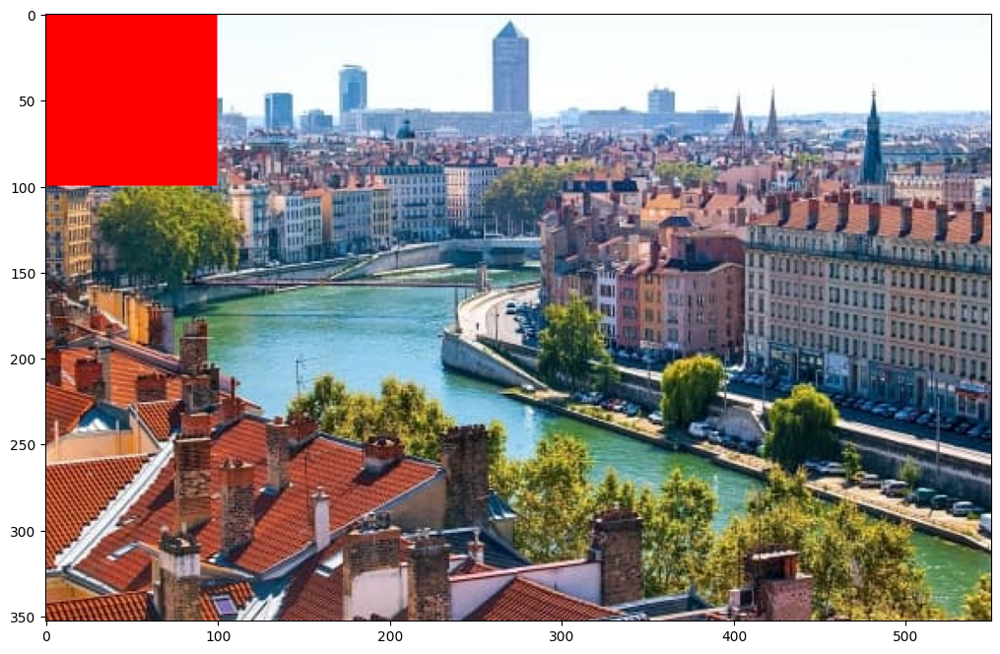

In [15]:
m_red = m.copy()

for i in range(100):
    for j in range(100):
        m_red[i][j] = np.array([255, 0, 0]) # on met tous les pixels en rouge

plt.imshow(m_red)
plt.show()

**Exercice** : Modifier le code précédent de façon à cacher la tour Part-Dieu ("tour crayon"), en mettant un rectangle bleu dessus.

## Inversion des couleurs

On peut inverser les couleurs d'une images en remplaçant chaque `m[i][j]` par `255 - m[i][j]`.

**Exercice** : Inverser les couleurs d'une image pour obtenir l'image ci-dessous. On pourra compléter le code suivant (dont on pourra aussi s'inspirer pour toutes les questions suivantes).

In [ ]:
def inverse(m):
    m = m.copy() # pour éviter de modifier la matrice en dehors de la fonction
    ... # parcourir m[i][j] en remplacant par 255 - m[i][j]
    return m

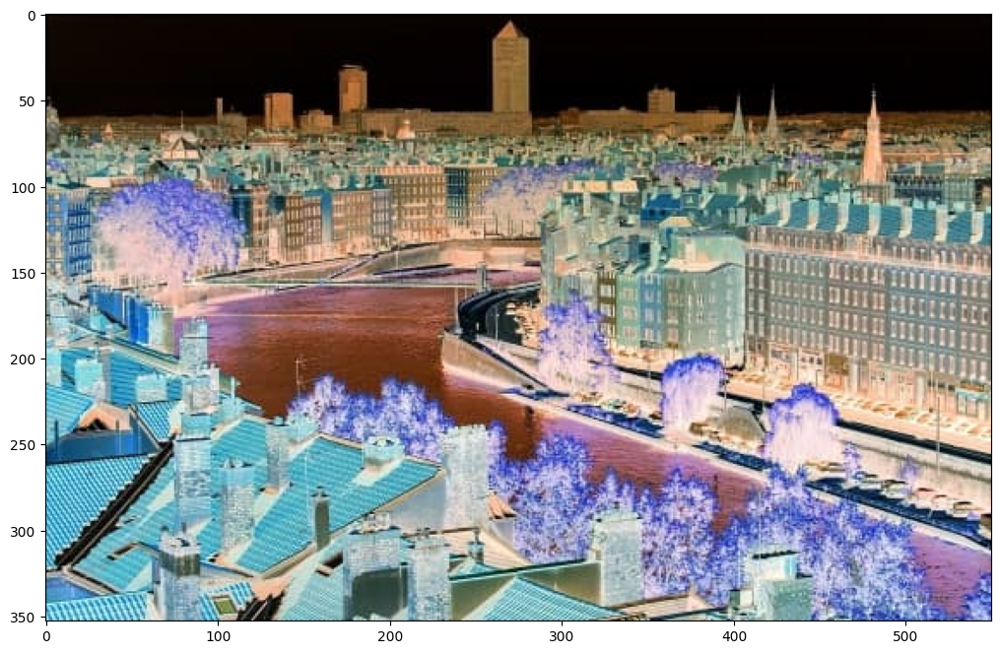

In [19]:
plt.imshow(inverse(m))
plt.show()

## Rotation

Faire une rotation sur l'image revient à prendre la matrice transposée : il faut inverser ligne et colonne. Si `m` est de taille $n\times p \times 3$, il faut donc créer une matrice `m2` de taille $p\times n\times 3$ telle que `m2[i][j] = m[j][i]`.

**Exercice** : Écrire une fonction `rotation(m)` renvoie une matrice correspondant à la rotation de `m`.

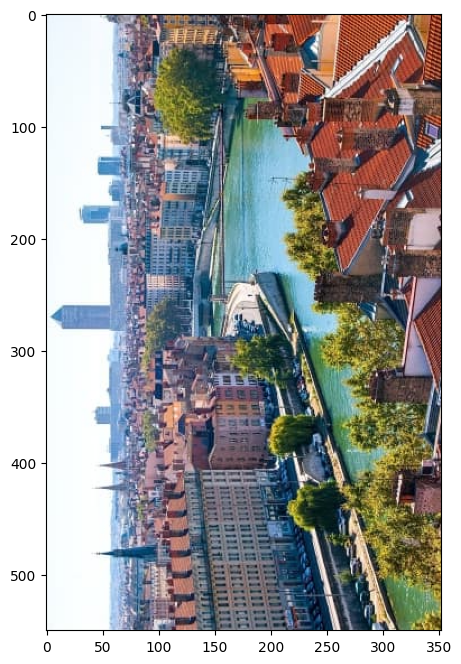

In [21]:
plt.imshow(rotation(m))
plt.show()

## Niveaux de gris

On peut transformer une image couleur en une image en niveaux de gris en remplaçant chaque pixel par la moyenne de ses trois couleurs.  

**Question** : Écrire une fonction `niveau_gris(m)` qui renvoie une matrice correspondant à l'image en niveaux de gris de `m`. On pourra compléter le code ci-dessous.

In [22]:
def niveau_gris(m):
    m2 = np.zeros((len(m), len(m[0])), dtype=int) # matrice de même taille que m, mais avec qu'un seul niveau de couleur
    for i in range(len(m)):
        for j in range(len(m[0])):
            ... # remplacer m2[i][j] par la moyenne des trois niveaux de couleur de m[i][j]
    return m2

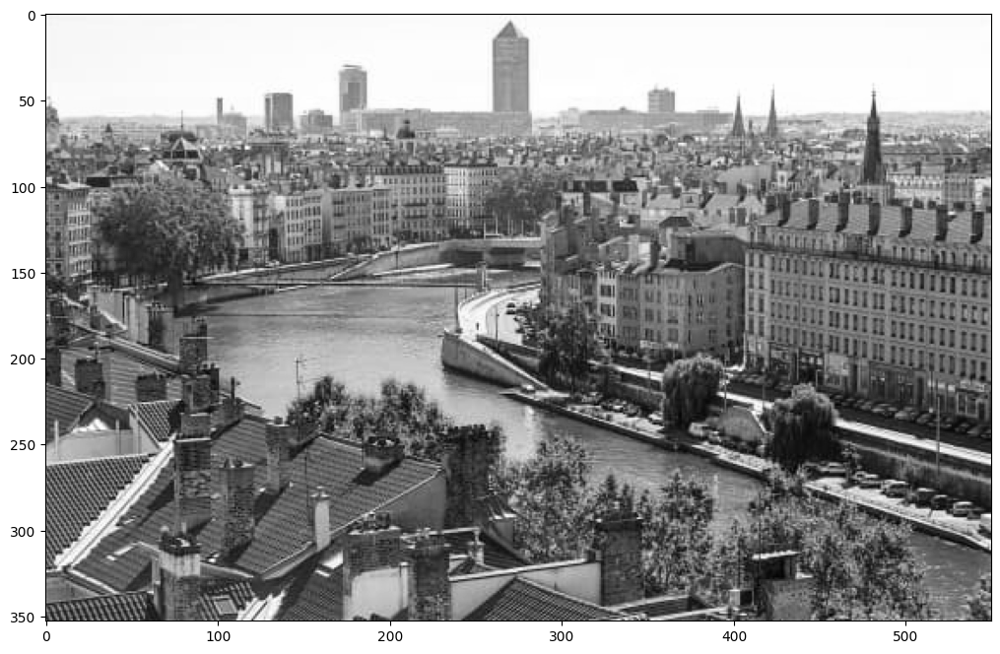

In [24]:
plt.imshow(niveau_gris(m), cmap="gray")
plt.show()

## Redimensionnement

On peut réduire la taille d'une image en divisant sa largeur et sa hauteur par un facteur $k$. Il faut donc définir une matrice `m2` de taille $(n/k)\times (p/k)\times 3$ telle que `m2[i][j] = m[i*k][j*k]`.

**Exercice** : Écrire une fonction `reduction(m, k)` renvoie une matrice correspondant au réduction de `m` par un facteur `k`.

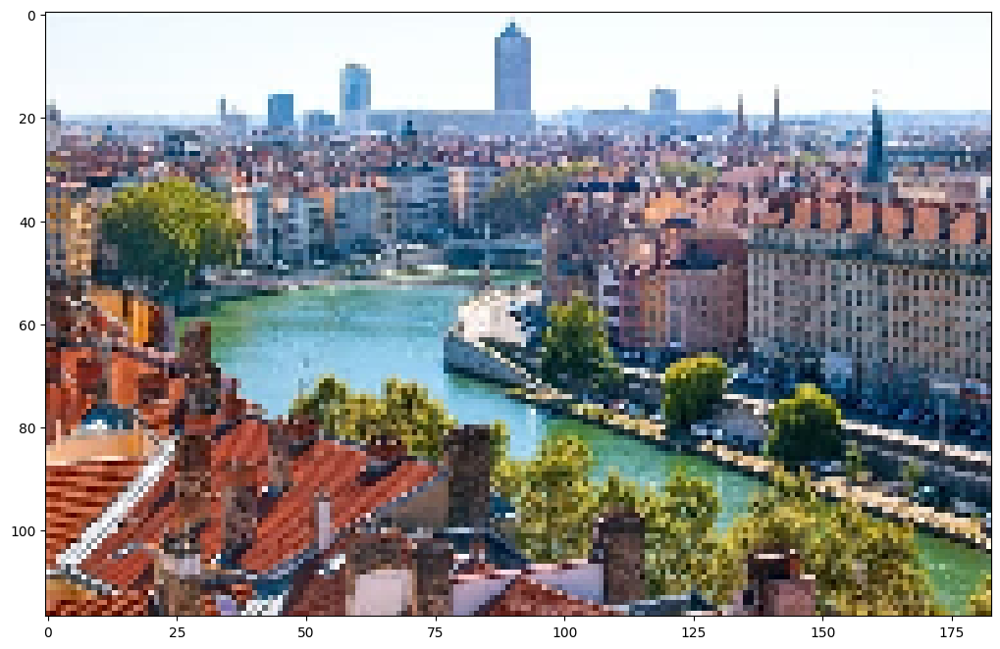

In [26]:
plt.imshow(reduction(m, 3))
plt.show()

**Exercice** : Faire de même pour augmenter la résolution de l'image. Il faut inverser `//` et `*` par rapport à la fonction précédente.

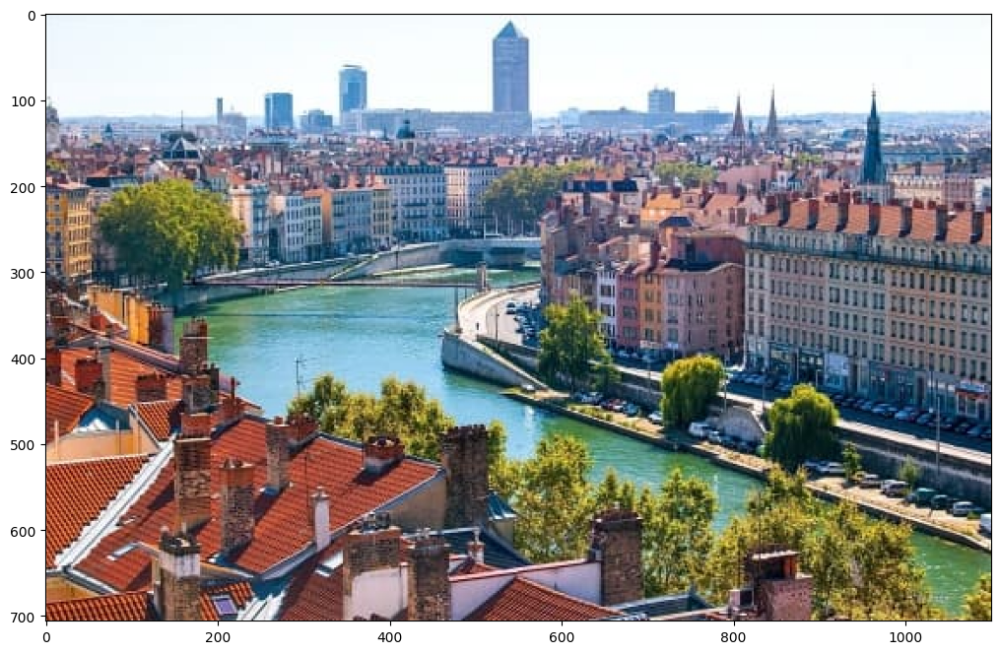

In [37]:
plt.imshow(augmentation(m, 2))
plt.show()

## Convolution

### Flou

En modifiant chaque pixel par la moyenne des (au plus) 9 pixels adjacents, on peut faire un effet de flou. **Il faut cependant faire attention à ne pas dépasser les bords de l'image**.

**Exercice** : Écrire une fonction `moyenne` telle que, si `m` est une matrice, `moyenne(m, i, j)` renvoie la moyenne des $9$ pixels adjacents autour de `m[i][j]` (c'est-à-dire de `m[i+1][j]`, `m[i-1][j]`...), sans prendre en compte les pixels sortants de l'image.

In [29]:
moyenne(m, 0, 0)

array([242.25, 251.25, 254.75])

**Exercice** : En déduire une fonction `flou` telle que `flou(m)` renvoie une image obtenue en prenant la moyenne de chaque pixel dans `m`. Essayer d'appliquer plusieurs fois `flou`.

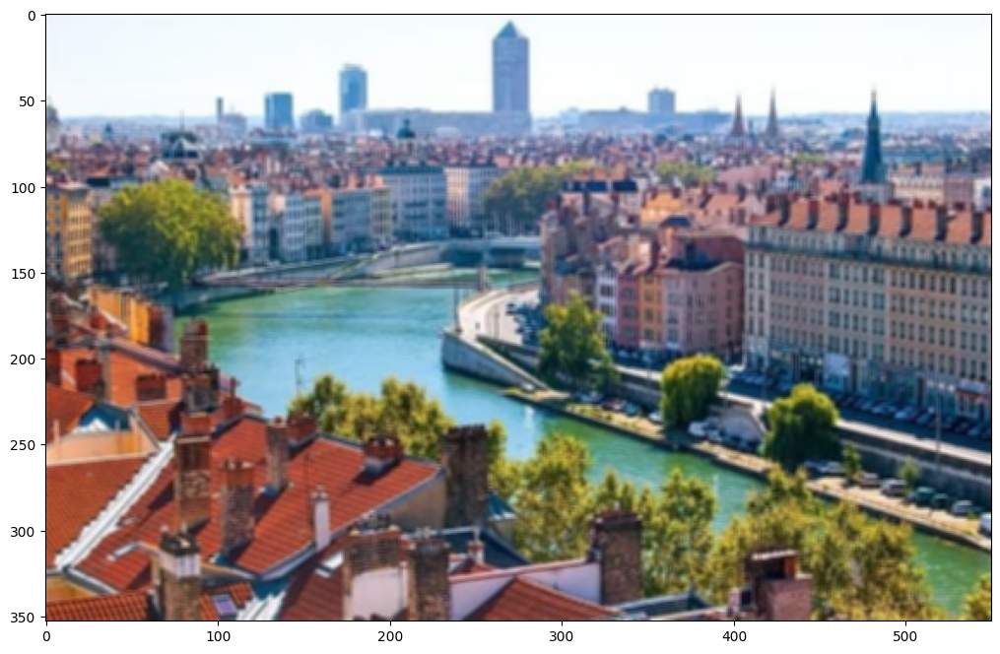

In [31]:
plt.imshow(flou(m))
plt.show()

### Détection de contours

Plutôt que de faire la moyenne des pixels adjacents, on peut faire une moyenne pondérée. Par exemple, pour détecter les contours dans une image, on peut donner un poids de $8$ au pixel central et un poids de $-1$ aux pixels adjacents, ce qui correspond au *filtre laplacien* suivant :  

$$\begin{pmatrix} -1& -1& -1 \\ -1 & 8 & -1 \\ -1 & -1 & -1 \end{pmatrix}$$

Si $M = (m_{i, j})$, il faut donc calculer la matrice $M' = (m_{i, j}')$ telle que :

$$m_{i, j}' = 8 m_{i, j} - m_{i-1, j-1} - m_{i-1, j} - m_{i-1, j+1} - m_{i, j-1} - m_{i, j+1} - m_{i+1, j-1} - m_{i+1, j} - m_{i+1, j+1}$$

Sachant qu'on ne prend pas en compte les pixels en dehors de l'image.

**Question** : Écrire une fonction `detection_contours(m)` qui renvoie la matrice `m2` telle que `m2[i][j]` est la moyenne pondérée des pixels adjacents à `m[i][j]`.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


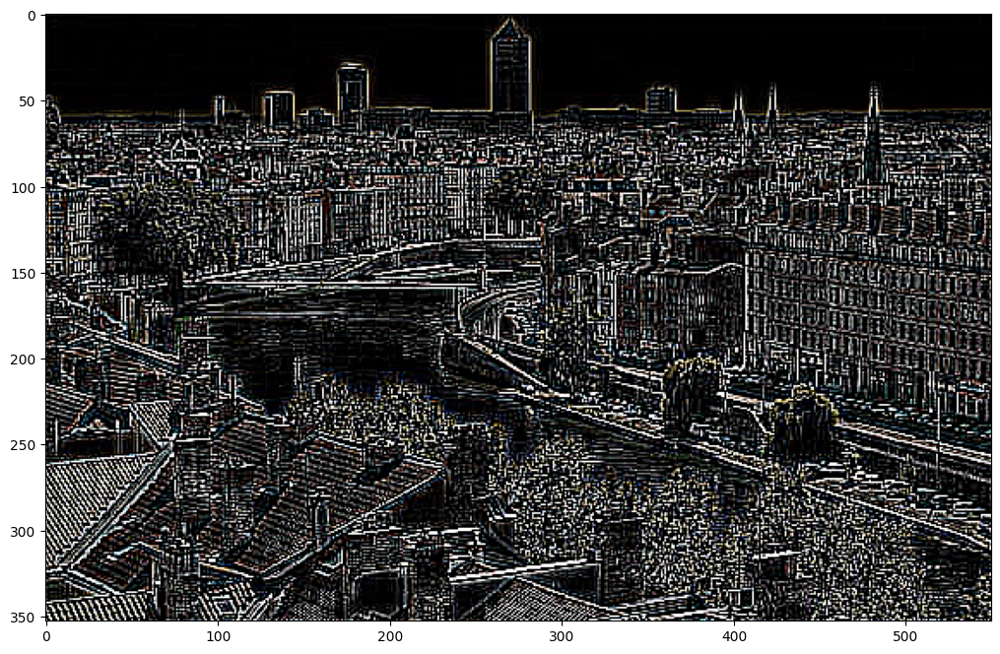

In [33]:
plt.imshow(detection_contours(m))
plt.show()

Le filtre de Sobel est un autre filtre, permettant spécifiquement de détecter les contours horizontaux et verticaux. Pour détecter un contours vertical, il est défini par  :

$$\begin{pmatrix} -1& 0& 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{pmatrix}$$

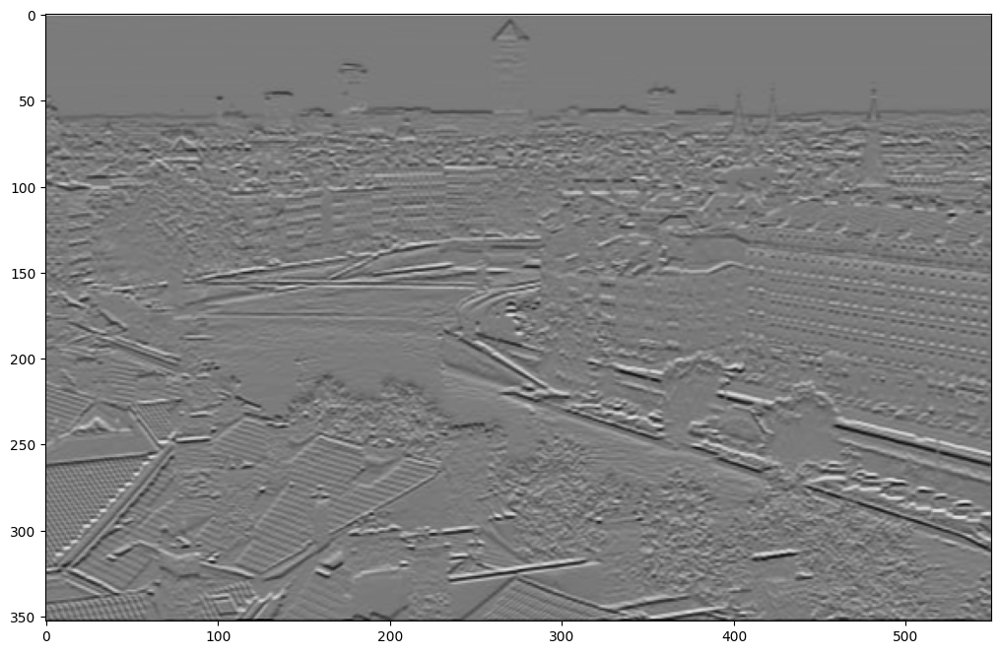

In [35]:
plt.imshow(sobel(niveau_gris(m)), cmap="gray")
plt.show()